In [1]:
!pip install --quiet scanpy
!pip install --quiet anndata
!pip install --quiet bbknn
!pip install --quiet scvelo
!pip install --quiet kneed


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.0/129.0 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 647.5/647.5 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 16.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.1/210.1 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.6/40.6 kB 2.4 MB/s eta 0:00:00


In [2]:
import scanpy as sc # Core scverse libraries
import anndata as ad # Core scverse libraries
#import igraph as ig # Core scverse libraries
import bbknn # Batch effect correction (batch balanced k nearest neighbour)
import scvelo as scv # Velocity
import kneed # Elbow method
from kneed import KneeLocator

In [3]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score

In [4]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

scanpy==1.10.2 anndata==0.10.9 umap==0.5.6 numpy==1.26.4 scipy==1.13.1 pandas==2.1.4 scikit-learn==1.3.2 statsmodels==0.14.2 pynndescent==0.5.13


In [5]:
# Import rhe dataset from google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# Load data
adata_filtered = sc.read_h5ad('/content/drive/MyDrive/Mammary gland Dataset/filtered_data_normalised.h5ad')
adata_filtered.var_names_make_unique()
adata_filtered

AnnData object with n_obs × n_vars = 40639 × 2082
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'doublet_score', 'predicted_doublet'
    var: 'EnsemblId', 'Gene Name Full', 'Info', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'log1p', 'pca', 'scrublet'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [7]:
adata_filtered.obs

,batch,n_genes,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,doublet_score,predicted_doublet
barcode,,,,,,,,,,,,,,,,,
AAACCTGAGACTAGGC-1-GSM4909253_N,GSM4909253_N,1359,1359,7.215240,3587.0,8.185350,287.0,5.662961,8.001115,1220.0,7.107426,34.011711,0.0,0.0,0.0,0.030505,False
AAACCTGAGGACAGAA-1-GSM4909253_N,GSM4909253_N,510,510,6.236370,1003.0,6.911747,4.0,1.609438,0.398804,415.0,6.030685,41.375874,0.0,0.0,0.0,0.045359,False
AAACCTGCAAGAGGCT-1-GSM4909253_N,GSM4909253_N,2594,2595,7.861727,10366.0,9.246383,408.0,6.013715,3.935944,2854.0,7.956827,27.532318,0.0,0.0,0.0,0.091116,False
AAACCTGGTAGCTTGT-1-GSM4909253_N,GSM4909253_N,733,734,6.599870,1628.0,7.395721,43.0,3.784190,2.641278,481.0,6.177944,29.545454,0.0,0.0,0.0,0.015625,False
AAACGGGAGAGGTAGA-1-GSM4909253_N,GSM4909253_N,455,455,6.122493,1230.0,7.115582,26.0,3.295837,2.113821,382.0,5.948035,31.056911,0.0,0.0,0.0,0.081933,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTCTGCAAT-1-GSM4909263_N,GSM4909263_N,1116,1117,7.019297,2075.0,7.638198,35.0,3.583519,1.686747,232.0,5.451038,11.180723,0.0,0.0,0.0,0.098814,False
TTTGTCAGTGCTTCTC-1-GSM4909263_N,GSM4909263_N,1651,1655,7.412160,3990.0,8.291797,309.0,5.736572,7.744361,817.0,6.706862,20.476191,0.0,0.0,0.0,0.030965,False
TTTGTCAGTTACTGAC-1-GSM4909263_N,GSM4909263_N,1282,1283,7.157735,3502.0,8.161375,142.0,4.962845,4.054826,974.0,6.882438,27.812677,0.0,0.0,0.0,0.082759,False


In [8]:
adata_filtered.var

,EnsemblId,Gene Name Full,Info,n_cells,mt,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,highly_variable,means,dispersions,dispersions_norm,mean,std
Gene Name,,,,,,,,,,,,,,,,,,,
ISG15,ENSG00000187608,ISG15,Gene Expression,5147,False,False,False,5597,0.222313,0.200745,87.598050,10033.0,9.213735,True,0.283840,2.207596,1.883032,2.797481e-18,0.396923
TNFRSF4,ENSG00000186827,TNFRSF4,Gene Expression,1330,False,False,False,1409,0.082340,0.079125,96.877908,3716.0,8.220673,True,0.126641,2.178553,1.829798,1.398741e-18,0.271572
MXRA8,ENSG00000162576,MXRA8,Gene Expression,1063,False,False,False,1198,0.033127,0.032590,97.345446,1495.0,7.310550,True,0.062286,1.545667,0.669747,7.693073e-18,0.191371
AL645728,ENSG00000215014,AL645728.1,Gene Expression,824,False,False,False,983,0.023177,0.022913,97.821848,1046.0,6.953684,True,0.033687,1.547148,0.672461,-2.797481e-18,0.136308
SKI,ENSG00000157933,SKI,Gene Expression,3937,False,False,False,4494,0.126413,0.119038,90.042101,5705.0,8.649274,True,0.144890,1.495212,0.577265,-6.993703e-18,0.279979
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
COL18A1,ENSG00000182871,COL18A1,Gene Expression,5646,False,False,False,6194,0.211035,0.191475,86.275205,9524.0,9.161675,True,0.311908,1.724094,0.867230,9.791184e-18,0.426149
COL6A1,ENSG00000142156,COL6A1,Gene Expression,11976,False,False,False,13127,0.613361,0.478320,70.912918,27681.0,10.228538,True,0.561739,1.638007,0.687378,1.538615e-17,0.573532
COL6A2,ENSG00000142173,COL6A2,Gene Expression,16531,False,False,False,17974,1.267029,0.818470,60.172834,57181.0,10.953995,True,0.970944,2.153242,0.770109,4.895592e-17,0.778299


#Nearest Neighbour Graph Construction and Visualization

In [9]:
sc.pp.neighbors(adata_filtered)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:56)


In [10]:
#Batch effect correction
sc.external.pp.bbknn(adata_filtered, batch_key="batch")

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)


In [11]:
sc.tl.umap(adata_filtered, random_state=0)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:47)


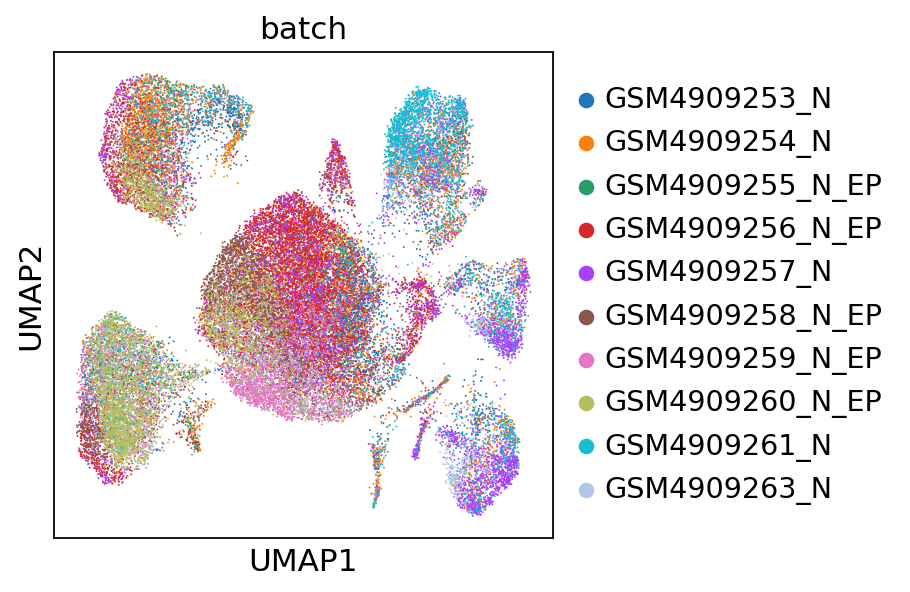

In [12]:
sc.pl.umap(adata_filtered,color="batch",frameon=True)

computing PCA
    with n_comps=50
    finished (0:00:30)


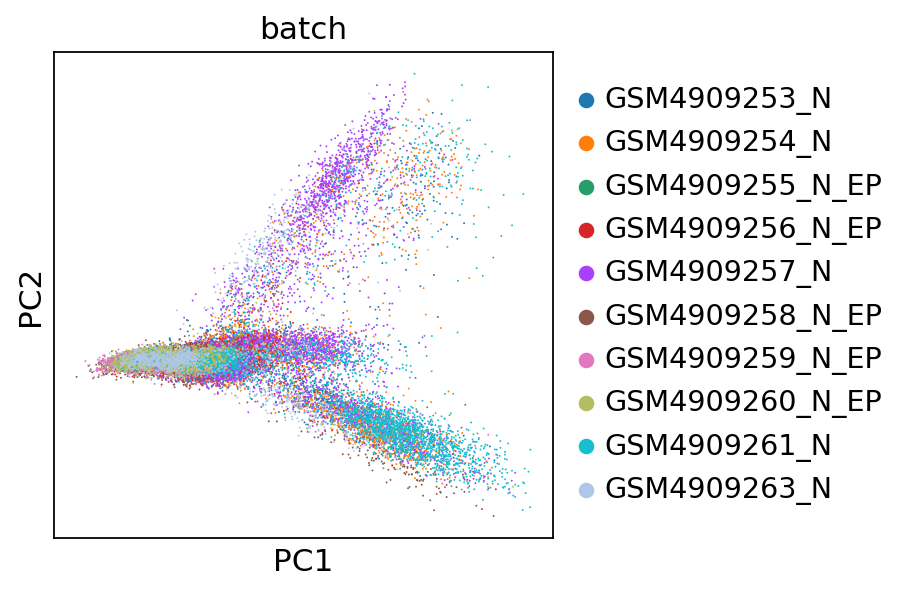

In [13]:
sc.tl.pca(adata_filtered)
sc.pl.pca(adata_filtered, color='batch')

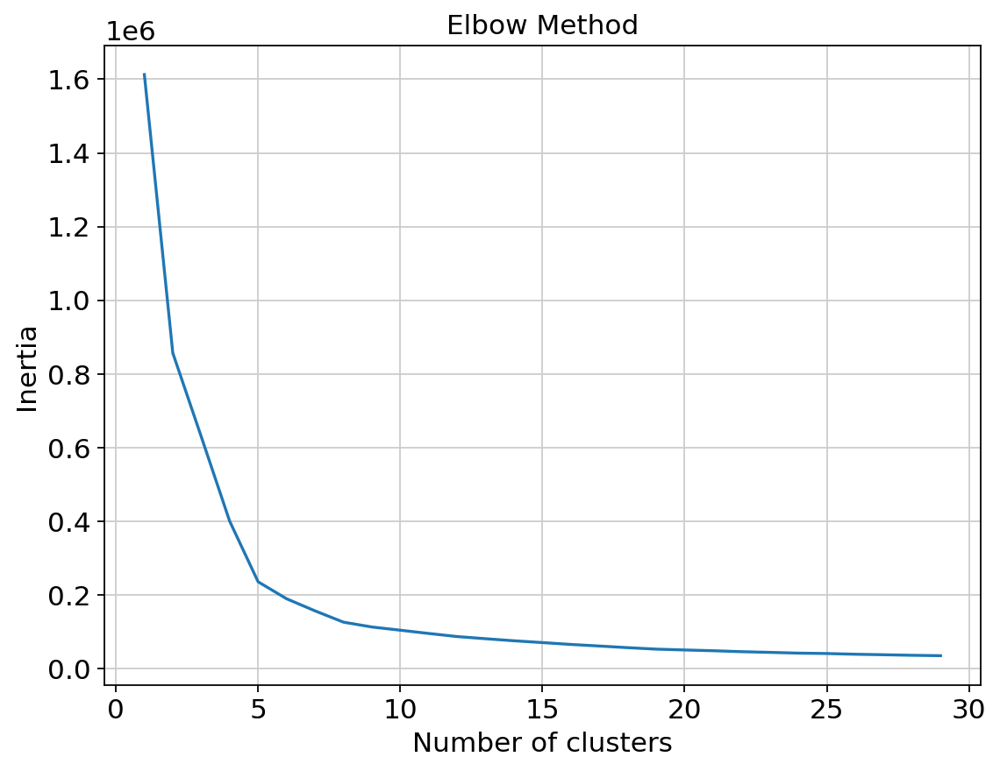

In [14]:
# we will use Elbow method for k selection
inertia = [] # Store inertia values for each k
# Define the range of k values
for k in range(1, 30):
    # Create a KMeans model with k clusters
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(adata_filtered.obsm['X_umap']) # Fit the model to the UMAP data
    inertia.append(kmeans.inertia_)
# Plot the inertia vs. number of clusters
plt.figure(figsize=(8, 6))
plt.plot(range(1, 30), inertia)
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

In [15]:
# OR find k autoumatically with kneed library
def calculate_kmeans_sse(X, max_elbow_number):
    sse = []
    for i in range(1, max_elbow_number):
        kmeans = KMeans(n_clusters=i, random_state=50)
        kmeans.fit(X)
        sse.append(kmeans.inertia_)
    return sse

def find_optimal_k(sse):
    # Using KneeLocator to find the elbow point
    kneedle = KneeLocator(range(1, len(sse) + 1), sse, curve="convex", direction="decreasing")
    return kneedle.elbow

# Find k
X = adata_filtered.obsm['X_umap']
max_elbow_number = 30  # Adjust as needed
sse = calculate_kmeans_sse(X, max_elbow_number)
optimal_k = find_optimal_k(sse)

print(f"Optimal number of clusters (Elbow Method): {optimal_k}")

Optimal number of clusters (Elbow Method): 5


In [16]:
# Choose k and fit k-means
k = 5  # choose based on Elbow method
#kmeans = KMeans(n_clusters=k, random_state=0)
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)  # Explicitly set n_init to support future updates
adata_filtered.obs['kmeans'] = kmeans.fit_predict(adata_filtered.obsm['X_umap'][:, :10]).astype(str)
adata_filtered.obs['kmeans'] = kmeans.labels_.astype(str) # Add k-means results to AnnData object

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:50)


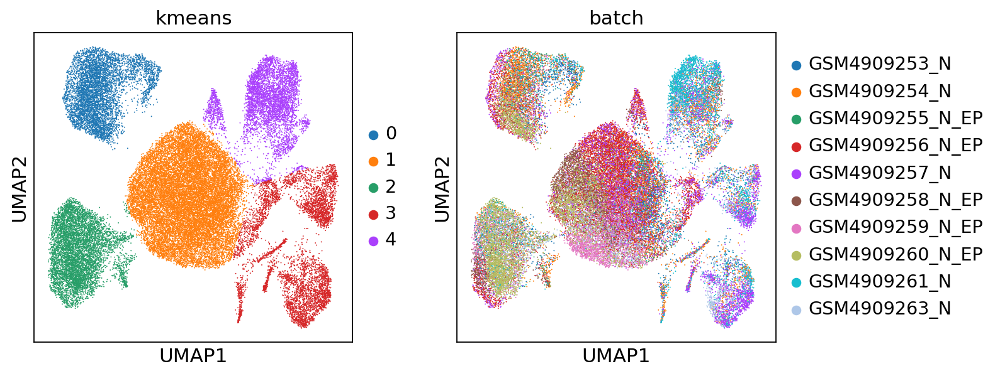

In [17]:
# Plot UMAP with k-means clustering results
sc.tl.umap(adata_filtered)
sc.pl.umap(adata_filtered, color=['kmeans','batch'])

#Finding marker genes

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


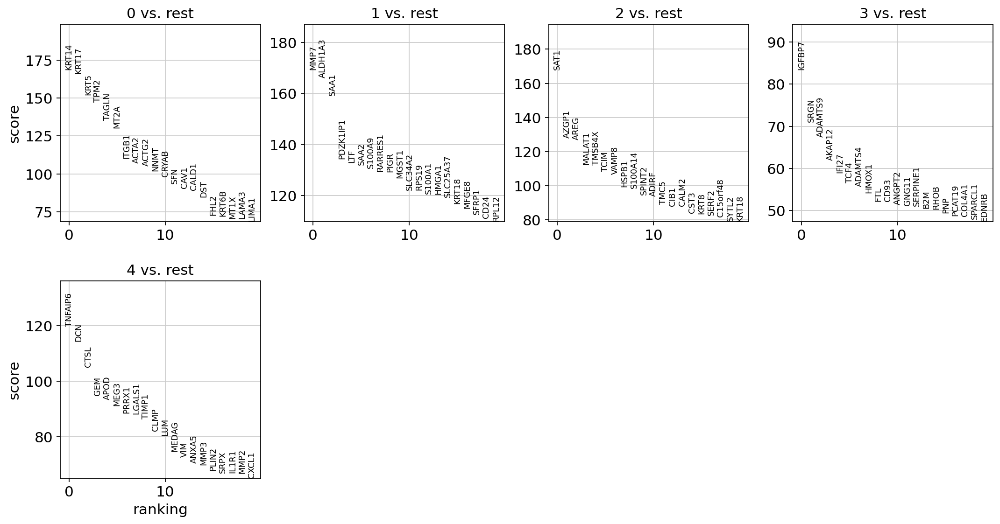

In [18]:
sc.tl.rank_genes_groups(adata_filtered, "kmeans", method="t-test")
sc.pl.rank_genes_groups(adata_filtered, n_genes=20, sharey=False) #, save = '_gene_rank.png')

In [19]:
pd.DataFrame(adata_filtered.uns["rank_genes_groups"]["names"]).head(20)

,0,1,2,3,4
0,KRT14,MMP7,SAT1,IGFBP7,TNFAIP6
1,KRT17,ALDH1A3,AZGP1,SRGN,DCN
2,KRT5,SAA1,AREG,ADAMTS9,CTSL
3,TPM2,PDZK1IP1,MALAT1,AKAP12,GEM
4,TAGLN,LTF,TMSB4X,IFI27,APOD
5,MT2A,SAA2,TCIM,TCF4,MEG3
6,ITGB1,S100A9,VAMP8,ADAMTS4,PRRX1
7,ACTA2,RARRES1,HSPB1,HMOX1,LGALS1
8,ACTG2,PIGR,S100A14,FTL,TIMP1
9,NNMT,MGST1,SPINT2,CD93,CLMP


In [20]:
markers = sc.get.rank_genes_groups_df(adata_filtered, None)
markers = markers[(markers.pvals_adj<0.05) & (markers.logfoldchanges.abs()> .5)]
markers.head()

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,KRT14,168.672958,7.537807,0.0,0.0
1,0,KRT17,166.235672,5.377252,0.0,0.0
2,0,KRT5,151.996613,5.710535,0.0,0.0
3,0,TPM2,147.320648,5.285815,0.0,0.0
4,0,TAGLN,135.403793,5.745841,0.0,0.0


In [21]:
sc.get.rank_genes_groups_df(adata_filtered, group='0').head(15)

,names,scores,logfoldchanges,pvals,pvals_adj
0,KRT14,168.672958,7.537807,0.0,0.0
1,KRT17,166.235672,5.377252,0.0,0.0
2,KRT5,151.996613,5.710535,0.0,0.0
3,TPM2,147.320648,5.285815,0.0,0.0
4,TAGLN,135.403793,5.745841,0.0,0.0
5,MT2A,130.290085,3.354391,0.0,0.0
6,ITGB1,110.382996,2.602735,0.0,0.0
7,ACTA2,107.018372,6.085194,0.0,0.0
8,ACTG2,105.199364,7.110630,0.0,0.0
9,NNMT,101.878197,3.222773,0.0,0.0


In [22]:
#list of marker genes
marker_genes = {
    "Basal cells": ['KRT17'],
    "Basal Epithalial Cells": ['KRT14','KRT5'],
    #'Perivascular cells': ['ITGB1','CAV1'],
    'Pericyte': ['TAGLN'],
    "Luminal Cells": ['KRT18'],
    "Luminal Epithalial Cells": ['KRT81','KRT23'],
    "Luminal Progenitor Cells": ['ALDH1A3'],
    "Myofibroblast":['VIM'],
    "Epithelial Progenitor Cells":['CD24'],
    "Pericyte": ['TAGLN'],
    "Monocytes": ['S100A9'],
    "Stromal Cells": ['ACTA2'],
    #"EMT Cancer Stem Cells": ['ALDH1A3'],
    "Exhausted CD8+ T Cells": ['IFI27'],
    "Fibroblast": ["DCN"],
    "Mesenchymal Cells": ['TIMP1'],

}

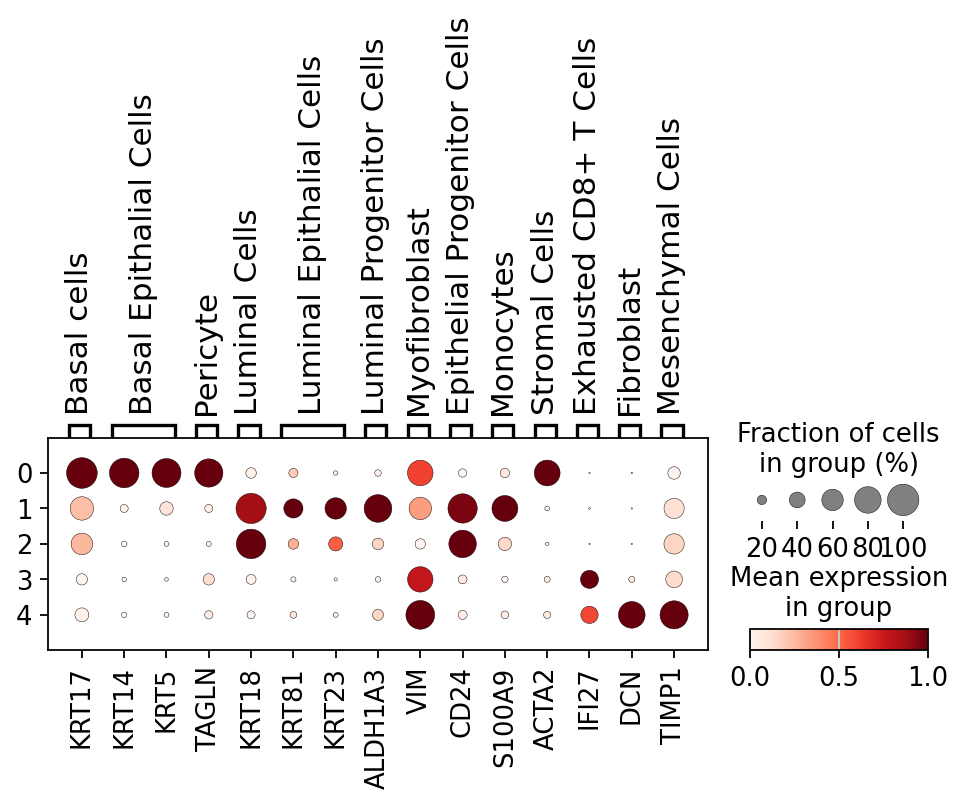

In [23]:
sc.pl.dotplot(adata_filtered, marker_genes, standard_scale="var", groupby='kmeans')

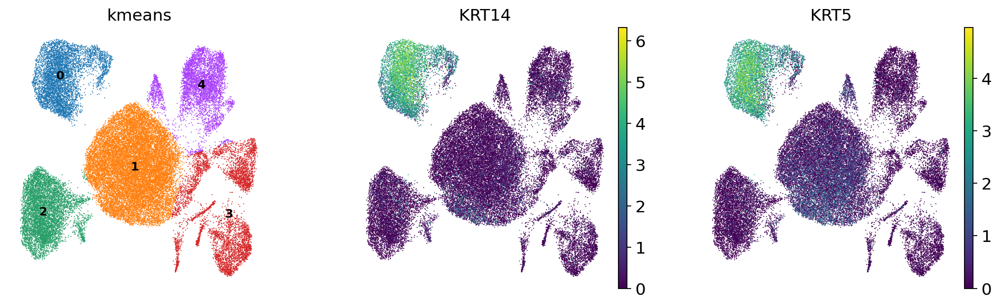

In [24]:
sc.pl.umap(adata_filtered, color=["kmeans",'KRT14','KRT5'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Basal Epithalial Cell

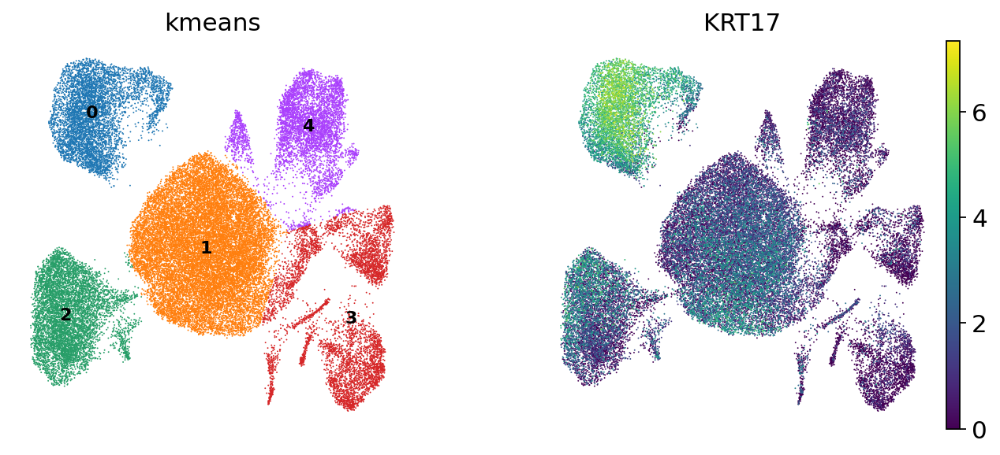

In [25]:
sc.pl.umap(adata_filtered, color=["kmeans",'KRT17'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Basal  Cell

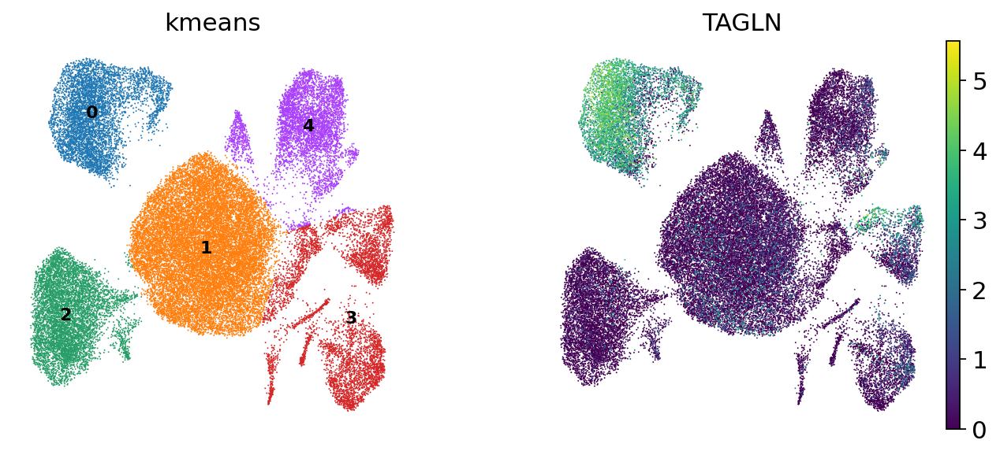

In [26]:
sc.pl.umap(adata_filtered, color=["kmeans",'TAGLN'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Pericytes

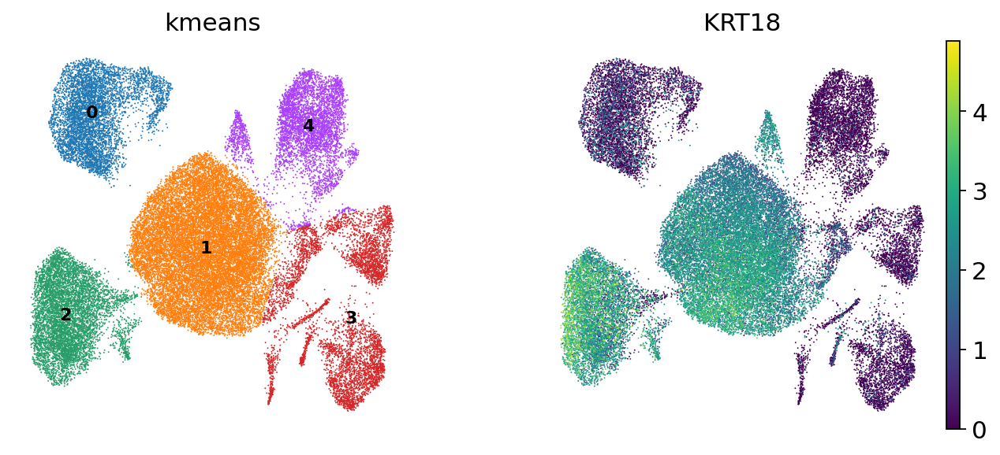

In [27]:
sc.pl.umap(adata_filtered, color=["kmeans",'KRT18'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Luminal Cell

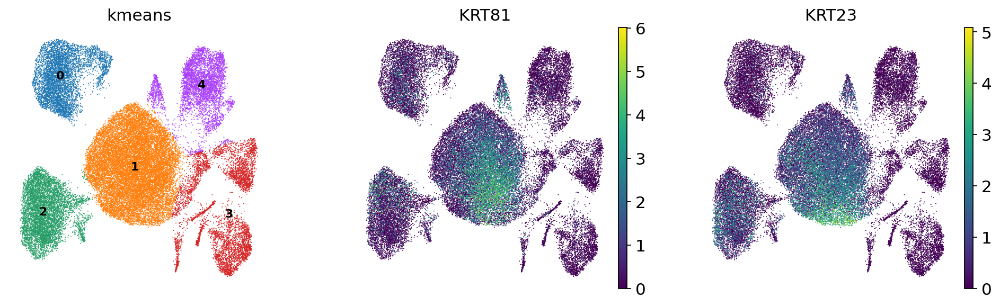

In [28]:
sc.pl.umap(adata_filtered, color=["kmeans",'KRT81','KRT23'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Luminal Epithalial Cell

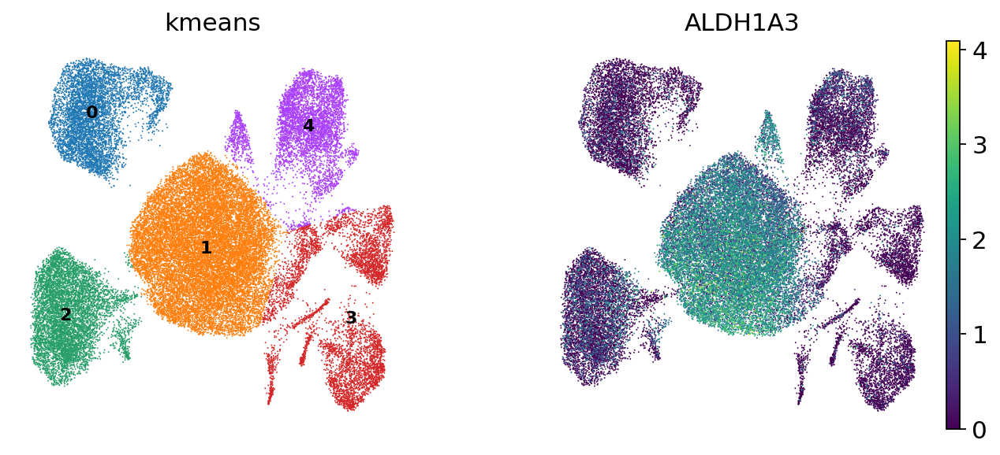

In [29]:
sc.pl.umap(adata_filtered, color=["kmeans",'ALDH1A3'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Luminal Progenitor Cell

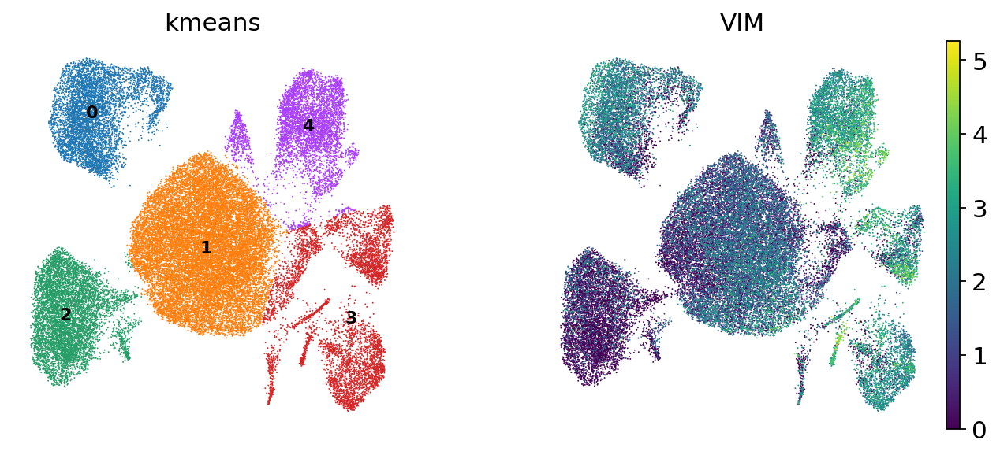

In [30]:
sc.pl.umap(adata_filtered, color=["kmeans",'VIM'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Myofibroblast

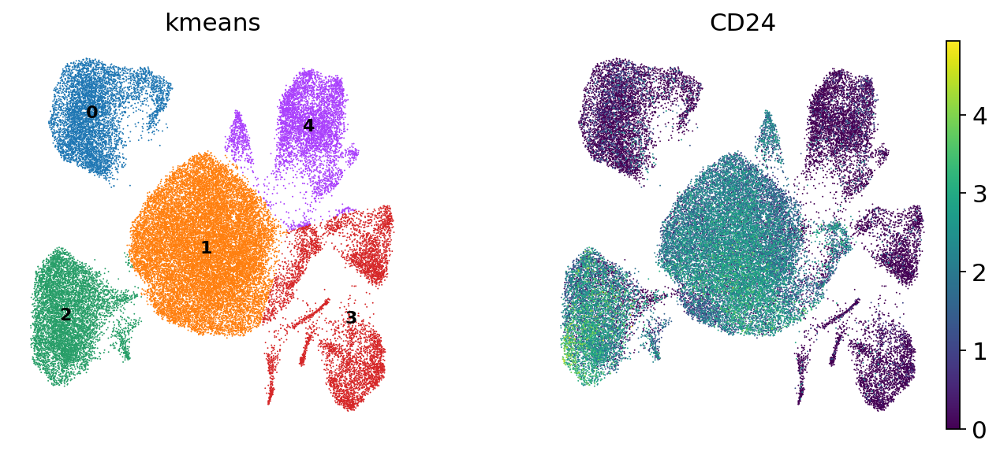

In [31]:
sc.pl.umap(adata_filtered, color=["kmeans",'CD24'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Epithalial Progenitor Cell

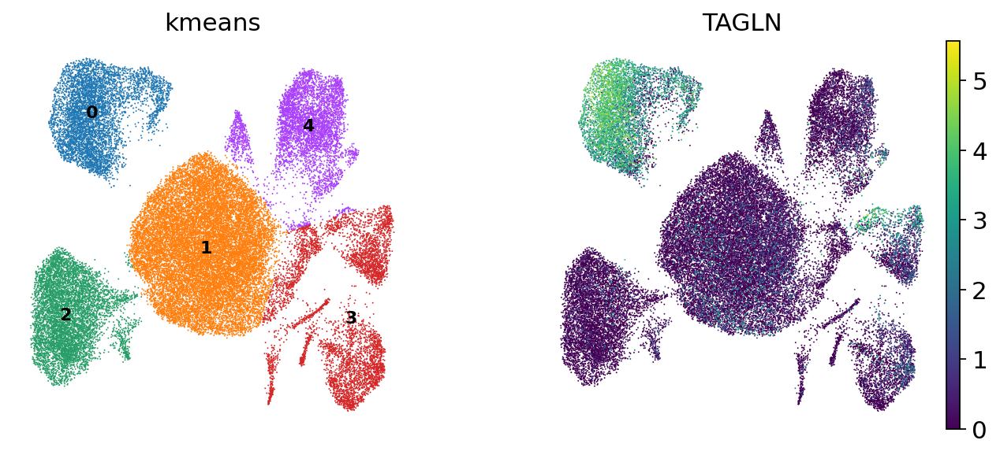

In [32]:
sc.pl.umap(adata_filtered, color=["kmeans",'TAGLN'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Pericytes

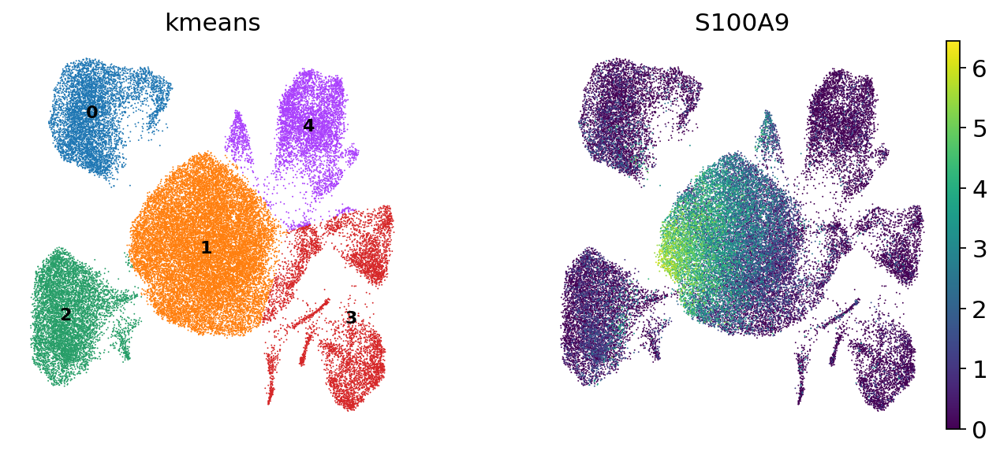

In [33]:
sc.pl.umap(adata_filtered, color=["kmeans",'S100A9'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Monocytes

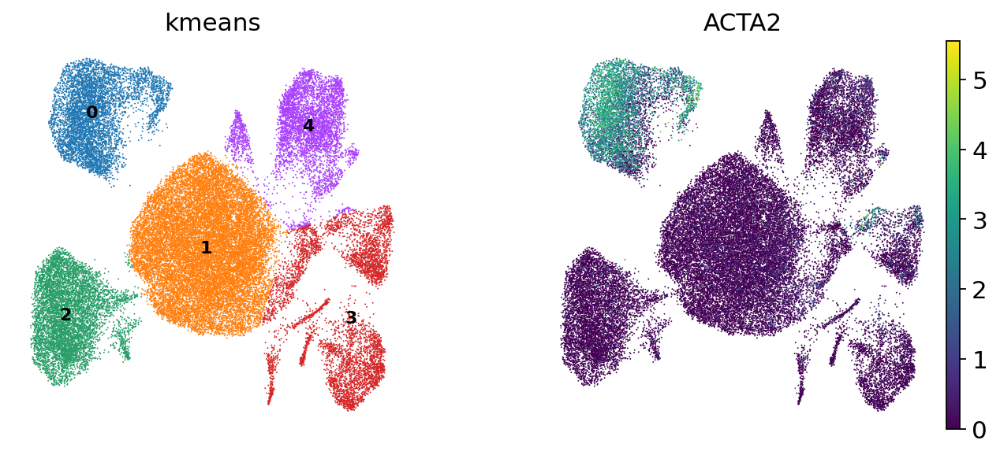

In [34]:
sc.pl.umap(adata_filtered, color=["kmeans",'ACTA2'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Stromal Cells

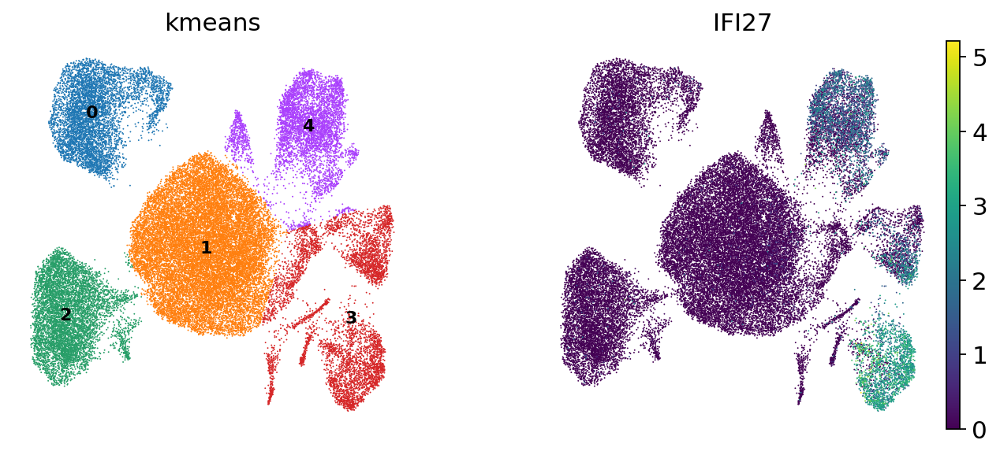

In [35]:
sc.pl.umap(adata_filtered, color=["kmeans",'IFI27'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Exhausted CD8+ Tcell

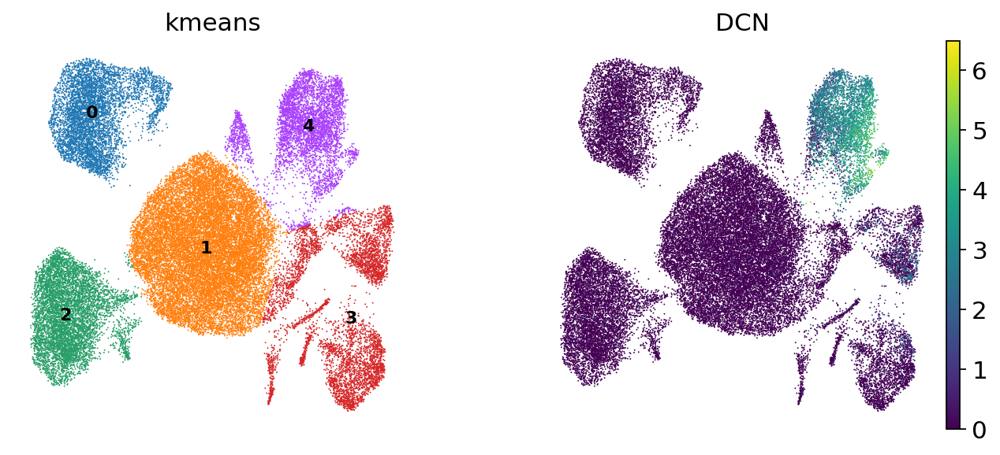

In [36]:
sc.pl.umap(adata_filtered, color=["kmeans","DCN"],legend_loc="on data", legend_fontsize=10, frameon=False,) # Fibroblast

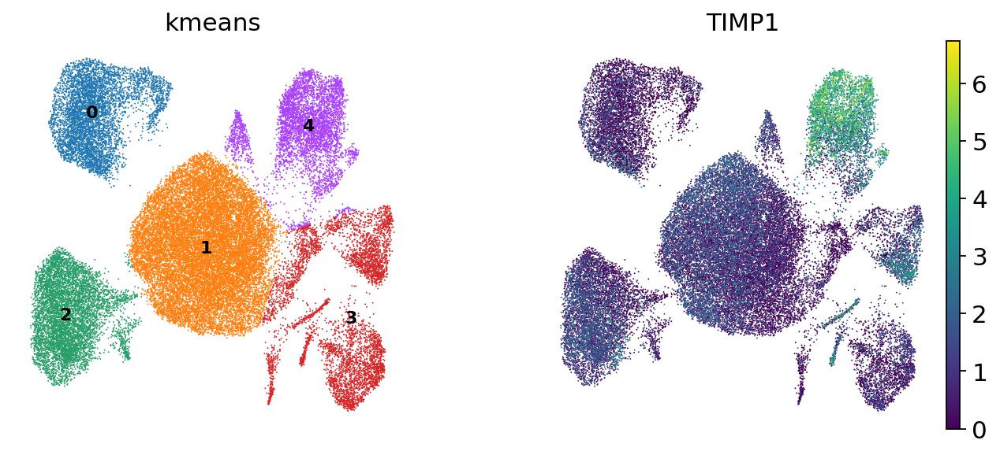

In [37]:
sc.pl.umap(adata_filtered, color=["kmeans",'TIMP1'],legend_loc="on data", legend_fontsize=10, frameon=False,) # Mesenchymal cell

In [38]:
#mark the cell types
Cell_Types = {
    "0": "Basal/Basal Epithalial Cell",
    "1": "Monocytes",
    "2": "Luminal Cell",
    "3": "Exhausted CD8+ T Cell",
    "4": "Fibroblast/Mesenchymal Cell",


}
adata_filtered.obs["Cell_Types"] = adata_filtered.obs["kmeans"].map(Cell_Types)

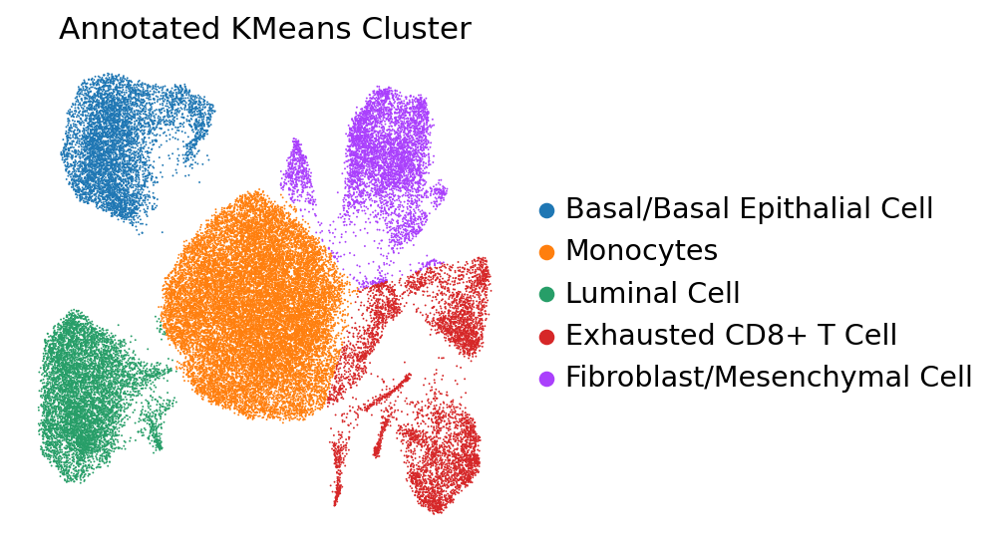

In [39]:
sc.pl.umap(
    adata_filtered, color = "Cell_Types",  title="Annotated KMeans Cluster", frameon=False, #save=".pdf"
)

In [40]:
# Abbreviated mark the cell types
Cell_Types = {
    "0": "BC/BEC",
    "1": "Ms",
    "2": "LC",
    "3": "Ex CD8+ TC",
    "4": "FB/MC",


}
adata_filtered.obs["Cell_Types"] = adata_filtered.obs["kmeans"].map(Cell_Types)

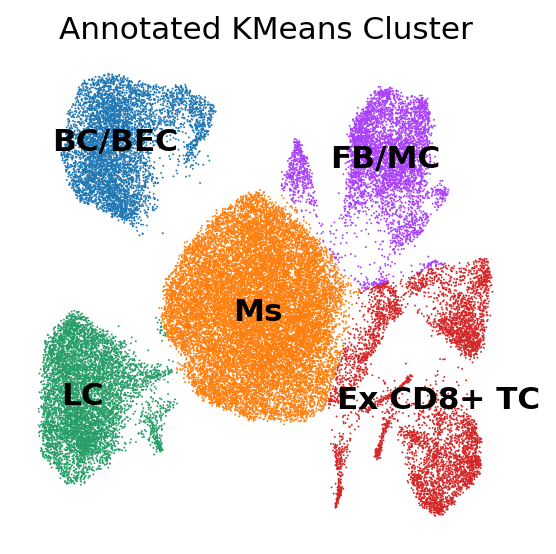

In [41]:
sc.pl.umap(
    adata_filtered, color = "Cell_Types", legend_loc="on data", title="Annotated KMeans Cluster", frameon=False, #save=".pdf"
)

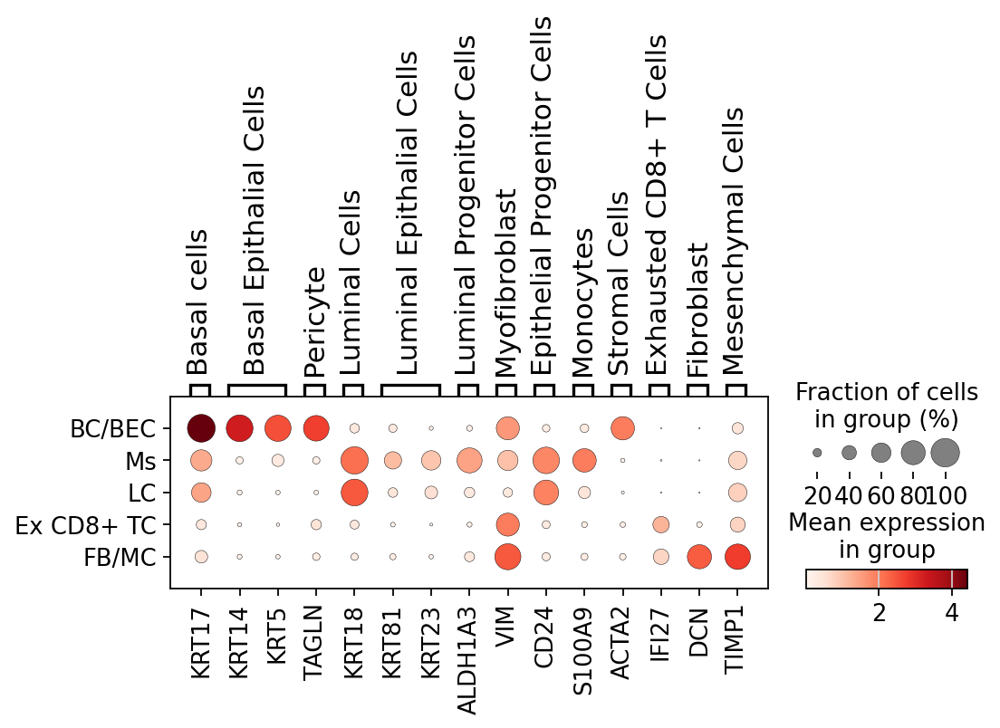

In [42]:
# Label Cell Types
sc.pl.dotplot(adata_filtered, marker_genes, groupby="Cell_Types")

In [43]:
# Compute the silhouette score for Kmeans
score = silhouette_score(adata_filtered.obsm['X_umap'], kmeans.labels_)
print(f'Silhouette Score for K-means clustering: {score}')

Silhouette Score for K-means clustering: 0.5454217791557312
